# Preprocessing Source's space

In [ ]:
# -----------------------
# Set working environment :
# ----------------------

import os
os.chdir("/home/INT/salmi.i/Téléchargements/Script Python")
print("Répertoire de travail actuel :", os.getcwd())

In [ ]:
# -----------------------
# Libraries importation :
# ----------------------
import numpy as np
import scipy.signal as spsg
import scipy.io as sio
import matplotlib.pyplot as plt
import networkx as nx
import mne
from tqdm import tqdm
import pandas as pd
from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit, GridSearchCV,  cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
import seaborn as sb
from sklearn.neighbors import KNeighborsClassifier
import time
from scipy.stats import pearsonr
from sklearn.ensemble import RandomForestClassifier
from scipy.signal import hilbert
import seaborn as sns
from scipy.signal import butter, filtfilt
from sklearn.decomposition import PCA
import pathlib
import sys
import copy
import tqdm
from mne import read_labels_from_annot
from mne.defaults import DEFAULTS

## Load Data STOP-IN

In [ ]:
# -----------------------
# Infos general :
# -----------------------
print('### TEST ###')
i_sub = 60
type_mov = 'SI'
type_space = 'source'
type_classif = 'socfacil'
freq_band = 'alpha'
# boolean for classification type
bool_socfacil = type_classif=='socfacil'
# check if directory for results exists; if not create
res_dir = 'res/'
os.makedirs(res_dir, exist_ok=True)
print('sub, classif type:', i_sub, type_classif)\
# colors for plots
cmapcolours = ['Blues','Greens','Oranges']

#measure_labels = ['pow','cov','corr']
measure_labels = ['pow','corr']
n_measures = len(measure_labels)
freq_bands = ['alpha','beta','gamma']
n_bands = len(freq_bands)

# -----------------------
# Data load :
# -----------------------

dir_path = './' 
file_name = 'dataClean-ICA-{}-T1.mat'.format(i_sub)

# sensor space: dataSorted4; source space: ic_data4
#var_dict = sio.loadmat(dir_path+file_name, variable_names=('ic_data', 'blockOrder')) 

# sensor space: dataSorted; source space: ic_data4; block index: 
var_dict = sio.loadmat(dir_path+file_name, variable_names=('dataSorted', 'blockOrder')) 
ts_tmp_si = var_dict['dataSorted'].reshape([128, 1600, 108, 12]) # [N,T,n_trials,block_index]
blk_index = var_dict['blockOrder'].flatten() # [block_index]
# get relevant blocks and labels for classification
# STOP-IN: solo=2, easy=4/8, hard=6/10
# PUNCH-THROUGH: solo=1, easy=3/7, hard=5/9
# ALL: pool STOP-IN and PUNCH-THROUGH
if type_mov=='SI':
    if bool_socfacil:
        # presence of social partner
        sel_blk = np.mod(blk_index,2)==0
        blk_labels = np.array(blk_index>2, dtype=int)
    else:
        # skill of social partner
        sel_blk = np.logical_and(np.mod(blk_index,2)==0, blk_index>2)
        blk_labels = np.array(np.logical_or(blk_index==6, blk_index==10), dtype=int)
elif type_mov=='PT':
    if bool_socfacil:
        # presence of social partner
        sel_blk = np.mod(blk_index,2)==1
        blk_labels = np.array(blk_index>2, dtype=int)
    else:
        # skill of social partner
        sel_blk = np.logical_and(np.mod(blk_index,2)==1, blk_index>2)
        blk_labels = np.array(np.logical_or(blk_index==5, blk_index==9), dtype=int)
else:
    raise ValueError('only SI or PT movement allowed')
    
# filter blocks
ts_tmp_si = ts_tmp_si[:,:,:,sel_blk]
blk_labels = blk_labels[sel_blk]
print(blk_index)
print(blk_labels)
print(ts_tmp_si[0,0,0,:])
print(ts_tmp_si.shape)

blk_index = np.array([2,2,4,8,6,10])
# Initializing labels
blk_labels = np.zeros_like(blk_index, dtype=int)
# Aassignment of labels based on conditions
if type_mov == 'SI' :
    #STOP IN
    for i, block in enumerate (blk_index) : 
        if block <= 2 : 
            blk_labels[i] = 0 # Absence of partner
        elif block in [4, 8]:
            blk_labels[i] = 1 # Easy Partner
        elif block in [6, 10]:
            blk_labels[i] = 2 # HArd partner
elif type_mov == 'PT' : 
    #PUNCH TROUGH       
    for i, block in enumerate(blk_index):
        if block <= 1 :
            blk_labels[i] = 0 # Absence of partner
        elif block in [3, 7]:
            blk_labels[i] = 1 # Easy Partner
        elif block in [5, 9]:
            blk_labels[i] = 2 # HArd partner
else:
    raise ValueError('only SI or PT movement allowed')
# Filter blocks select
sel_blk = blk_labels != -1 #-1 indicates an unselected block
#Adjust the size of sel_blk to match the size of the blocks in ts_tmp
sel_blk = sel_blk[:ts_tmp_si.shape[3]]
ts_tmp_si = ts_tmp_si[:,:,:,sel_blk]
blk_labels = blk_labels[sel_blk]
print(blk_index)
print(blk_labels)
print(ts_tmp_si[0,0,0,:])
print(ts_tmp_si.shape)

# -----------------------
# Discard silent and nan trials :
# -----------------------
invalid_trials = np.logical_or(np.abs(ts_tmp_si[0,0,:,:]).max(axis=1)==0, np.isnan(ts_tmp_si[0,0,:,0]))
valid_trials = np.logical_not(invalid_trials)
ts_tmp_si = ts_tmp_si[:,:,valid_trials,:]
n_trials = valid_trials.sum()
# check for good cleaning
print('remaining nans:', np.sum(np.isnan(ts_tmp_si)))
print(ts_tmp_si.shape)
print(ts_tmp_si[0,0,0,:])

## Load Data PUNCH-TROUGH

In [ ]:
# -----------------------
# General Info:
# -----------------------
print('### TEST ###')
i_sub = 60
type_mov = 'PT'
type_space = 'source'
type_classif = 'socfacil'
freq_band = 'alpha'
# Boolean for classification type
bool_socfacil = type_classif == 'socfacil'
# Check if directory for results exists; if not, create it
res_dir = 'res/'
os.makedirs(res_dir, exist_ok=True)
print('sub, classif type:', i_sub, type_classif)

# Colors for plots
cmapcolours = ['Blues', 'Greens', 'Oranges']

# Measure labels
measure_labels = ['pow', 'corr']
n_measures = len(measure_labels)
freq_bands = ['alpha', 'beta', 'gamma']
n_bands = len(freq_bands)

# -----------------------
# Data Load:
# -----------------------

dir_path = './'
file_name = 'dataClean-ICA-{}-T1.mat'.format(i_sub)

# Sensor space: dataSorted4; source space: ic_data4
# var_dict = sio.loadmat(dir_path+file_name, variable_names=('ic_data', 'blockOrder'))

# Sensor space: dataSorted; source space: ic_data4; block index:
var_dict = sio.loadmat(dir_path+file_name, variable_names=('dataSorted', 'blockOrder'))
ts_tmp_pt = var_dict['dataSorted'].reshape([128, 1600, 108, 12])  # [N, T, n_trials, block_index]
blk_index = var_dict['blockOrder'].flatten()  # [block_index]

# Get relevant blocks and labels for classification
# STOP-IN: solo=2, easy=4/8, hard=6/10
# PUNCH-THROUGH: solo=1, easy=3/7, hard=5/9
# ALL: pool STOP-IN and PUNCH-THROUGH
if type_mov == 'SI':
    if bool_socfacil:
        # Presence of social partner
        sel_blk = np.mod(blk_index, 2) == 0
        blk_labels = np.array(blk_index > 2, dtype=int)
    else:
        # Skill of social partner
        sel_blk = np.logical_and(np.mod(blk_index, 2) == 0, blk_index > 2)
        blk_labels = np.array(np.logical_or(blk_index == 6, blk_index == 10), dtype=int)
elif type_mov == 'PT':
    if bool_socfacil:
        # Presence of social partner
        sel_blk = np.mod(blk_index, 2) == 1
        blk_labels = np.array(blk_index > 2, dtype=int)
    else:
        # Skill of social partner
        sel_blk = np.logical_and(np.mod(blk_index, 2) == 1, blk_index > 2)
        blk_labels = np.array(np.logical_or(blk_index == 5, blk_index == 9), dtype=int)
else:
    raise ValueError('only SI or PT movement allowed')

# Filter blocks
ts_tmp_pt = ts_tmp_pt[:, :, :, sel_blk]
blk_labels = blk_labels[sel_blk]
print(blk_index)
print(blk_labels)
print(ts_tmp_pt[0, 0, 0, :])
print(ts_tmp_pt.shape)

blk_index = np.array([1, 1, 3, 7, 5, 9])
# Initialize labels
blk_labels = np.zeros_like(blk_index, dtype=int)
# Assign labels based on conditions
if type_mov == 'SI':
    # STOP IN
    for i, block in enumerate(blk_index):
        if block <= 2:
            blk_labels[i] = 0  # Absence of partner
        elif block in [4, 8]:
            blk_labels[i] = 1  # Easy partner
        elif block in [6, 10]:
            blk_labels[i] = 2  # Difficult partner
elif type_mov == 'PT':
    # PUNCH THROUGH
    for i, block in enumerate(blk_index):
        if block <= 1:
            blk_labels[i] = 0  # Absence of partner
        elif block in [3, 7]:
            blk_labels[i] = 1  # Easy partner
        elif block in [5, 9]:
            blk_labels[i] = 2  # Difficult partner
else:
    raise ValueError('only SI or PT movement allowed')

# Filter selected blocks
sel_blk = blk_labels != -1  # -1 indicates a non-selected block
# Adjust the size of sel_blk to match the block dimension in ts_tmp
sel_blk = sel_blk[:ts_tmp_pt.shape[3]]
ts_tmp_pt = ts_tmp_pt[:, :, :, sel_blk]
blk_labels = blk_labels[sel_blk]
print(blk_index)
print(blk_labels)
print(ts_tmp_pt[0, 0, 0, :])
print(ts_tmp_pt.shape)

# -----------------------
# Discard silent and nan trials:
# -----------------------
invalid_trials = np.logical_or(np.abs(ts_tmp_pt[0, 0, :, :]).max(axis=1) == 0, np.isnan(ts_tmp_pt[0, 0, :, 0]))
valid_trials = np.logical_not(invalid_trials)
ts_tmp_pt = ts_tmp_pt[:, :, valid_trials, :]
n_trials = valid_trials.sum()
# Check for good cleaning
print('remaining nans:', np.sum(np.isnan(ts_tmp_pt)))
print(ts_tmp_pt.shape)
print(ts_tmp_pt[0, 0, 0, :])

## Make Dig Montage GSN129

In [ ]:
# -----------------------#
# Get the metric for dig_montage :
# -----------------------
montage = mne.channels.read_custom_montage('GSN129.sfp')
ch_pos = montage._get_ch_pos() 
#print(ch_pos)

# -----------------------
# Create dig_montage :
# -----------------------
montage = mne.channels.make_dig_montage(ch_pos=ch_pos,
                                  nasion=[ 0.        ,  0.09821842, -0.02554916], 
                                  lpa=[-0.07266855,  0.00043744, -0.03520521],
                                  rpa=[ 0.07266855,  0.00043744, -0.03520521],  
                                  hsp=None,
                                  hpi=None, 
                                  coord_frame='unknown')
print(montage.get_positions())

# -----------------------
# Montage plot  :
# -----------------------

montage.plot()  # 2D

fig = montage.plot(kind="3d", show=False)  # 3D
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial

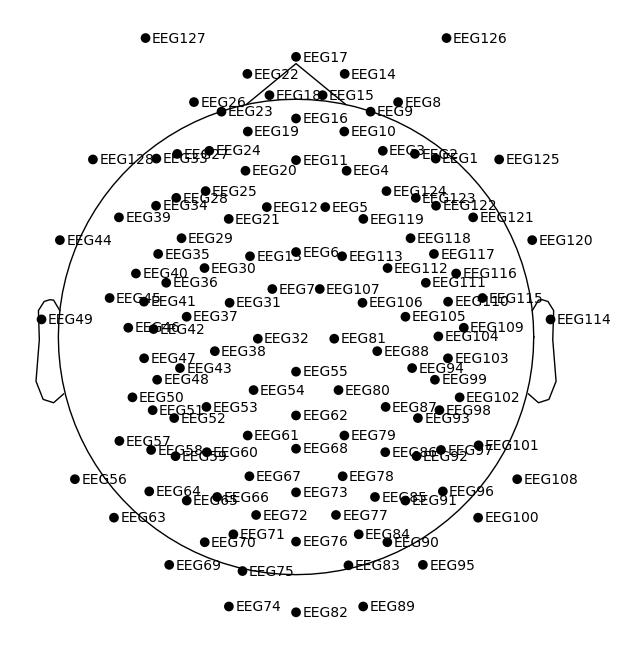 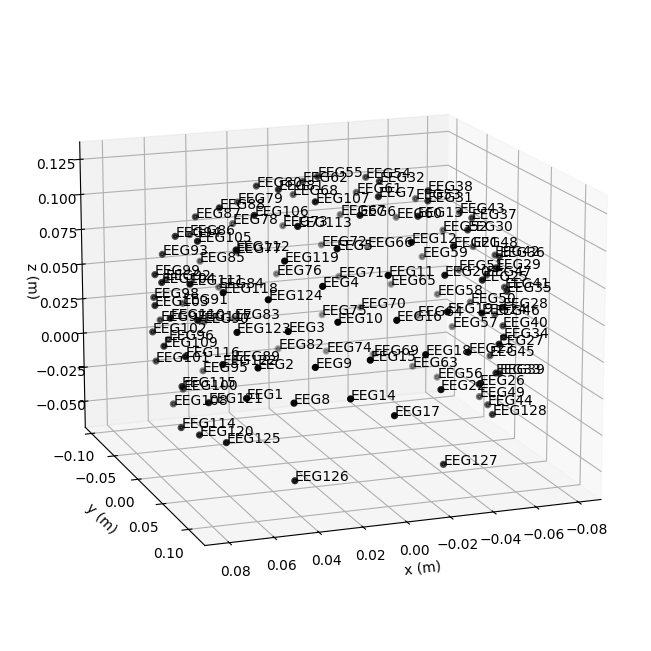

## Create Info 

In [ ]:
#-----------------------# 
# Create info  :
# ----------------------# 
sfreq = 500.0 # np.diff(X).mean() if not sure about the freq
info = mne.create_info( ch_names=montage.ch_names, sfreq=sfreq, ch_types="eeg", verbose = None)
info["bads"] = ["EEG94","EEG99","EEG127"]
info.set_montage(montage)
print(info)
#info.save("info_eeg_gsn129-info.fif")

## Create Events

In [ ]:
# Parameters
# resolution 2ms, trial starting 0.8s before go signal

start = 400 # time of go event in trial (in timepoint)
increment = 1600 # time points per trial
num_events = 214
event_id_solo = {"solo":1}
event_id_easy = {"easy":2}
event_id_hard = {"hard":3}
baseline= (-0.8,0)

# Creating array for each event 
events_solo = np.array([(start + i * increment, 0, 1) for i in range(num_events)])
events_easy = np.array([(start + i * increment, 0, 2) for i in range(num_events)])
events_hard = np.array([(start + i * increment, 0, 3) for i in range(num_events)])

print(events_solo)
print(events_easy)
print(events_hard)

## Create Epochs

### STOP-IN

In [ ]:
# ----------------------# 
# Preparing shape
# ----------------------# 

solo_ts_si = ts_tmp_si[:,:,:,:2].reshape(128,1600,-1)
print(solo_ts_si.shape)

easy_ts_si = ts_tmp_si[:,:,:,2:4].reshape(128,1600,-1)
print(easy_ts_si.shape)

hard_ts_si = ts_tmp_si[:,:,:,-2:].reshape(128,1600,-1)
print(hard_ts_si.shape)


# Changing axis to be in the form of (n_epochs, n_channels, n_times)
easy_ts_epochs_si = np.moveaxis(easy_ts_si,(2,0,1),(0,1,2))
print(easy_ts_epochs_si.shape)

solo_ts_epochs_si = np.moveaxis(solo_ts_si,(2,0,1),(0,1,2))
print(solo_ts_epochs_si.shape)

hard_ts_epochs_si = np.moveaxis(hard_ts_si,(2,0,1),(0,1,2))
print(hard_ts_epochs_si.shape)

# ----------------------# 
# Epochs Array
# ----------------------# 

epochs_solo_si = mne.EpochsArray(solo_ts_epochs_si,info,events= events_solo,tmin=-0.8 ,event_id=event_id_solo, baseline=None) 
#fig = epochs_solo.plot(scalings='2')

epochs_easy_si = mne.EpochsArray(easy_ts_epochs_si,info,events= events_easy,tmin=-0.8,event_id=event_id_easy,baseline=None)
#fig = epochs_easy.plot(scalings='2')

epochs_hard_si = mne.EpochsArray(hard_ts_epochs_si,info,events= events_hard,tmin=-0.8,event_id=event_id_hard,baseline=None)
#fig = epochs_hard.plot(scalings='2')

# ----------------------# 
# Set montage + drop bad channels
# ----------------------# 

epochs_solo_si.set_montage(montage).drop_channels(["EEG94","EEG99","EEG127"])
epochs_easy_si.set_montage(montage).drop_channels(["EEG94","EEG99","EEG127"])
epochs_hard_si.set_montage(montage).drop_channels(["EEG94","EEG99","EEG127"])

# ----------------------# 
# Band pass filter 1.00 Hz to 100.00 Hz
# ----------------------# 

epochs_solo_filtered_si = epochs_solo_si.copy().filter(l_freq =1.0, h_freq = 100.0, method='iir')
epochs_easy_filtered_si = epochs_easy_si.copy().filter(l_freq =1.0, h_freq = 100.0, method='iir')
epochs_hard_filtered_si = epochs_hard_si.copy().filter(l_freq =1.0, h_freq = 100.0, method='iir')


In [ ]:
# -----------------------
# Conditions STOP-IN :
# -----------------------
ep_solo_si = epochs_solo_filtered_si
ep_easy_si = epochs_easy_filtered_si
ep_hard_si = epochs_hard_filtered_si

# -----------------------
#  STOP-IN :
# -----------------------
ep_si = mne.concatenate_epochs([ep_solo_si,ep_easy_si,ep_hard_si])
ep_si

### PUNCH-TROUG

In [ ]:
# ----------------------# 
# Preparing shape
# ----------------------# 

solo_ts_pt = ts_tmp_pt[:,:,:,:2].reshape(128,1600,-1)
print(solo_ts_pt.shape)

easy_ts_pt = ts_tmp_pt[:,:,:,2:4].reshape(128,1600,-1)
print(easy_ts_pt.shape)

hard_ts_pt = ts_tmp_pt[:,:,:,-2:].reshape(128,1600,-1)
print(hard_ts_pt.shape)

# Changing axis to be in the form of (n_epochs, n_channels, n_times)
easy_ts_epochs_pt = np.moveaxis(easy_ts_pt,(2,0,1),(0,1,2))
print(easy_ts_epochs_pt.shape)

solo_ts_epochs_pt = np.moveaxis(solo_ts_pt,(2,0,1),(0,1,2))
print(solo_ts_epochs_pt.shape)

hard_ts_epochs_pt = np.moveaxis(hard_ts_pt,(2,0,1),(0,1,2))
print(hard_ts_epochs_pt.shape)

# ----------------------# 
# Epochs Array
# ----------------------# 

epochs_solo_pt = mne.EpochsArray(solo_ts_epochs_pt,info,events= events_solo,tmin=-0.8 ,event_id=event_id_solo, baseline=None) 
#fig = epochs_solo.plot(scalings='2')

epochs_easy_pt = mne.EpochsArray(easy_ts_epochs_pt,info,events= events_easy,tmin=-0.8,event_id=event_id_easy,baseline=None)
#fig = epochs_easy.plot(scalings='2')

epochs_hard_pt = mne.EpochsArray(hard_ts_epochs_pt,info,events= events_hard,tmin=-0.8,event_id=event_id_hard,baseline=None)
#fig = epochs_hard.plot(scalings='2')

# ----------------------# 
# Set montage + drop bad channels
# ----------------------# 

epochs_solo_pt.set_montage(montage).drop_channels(["EEG94","EEG99","EEG127"])
epochs_easy_pt.set_montage(montage).drop_channels(["EEG94","EEG99","EEG127"])
epochs_hard_pt.set_montage(montage).drop_channels(["EEG94","EEG99","EEG127"])

# ----------------------# 
# Band pass filter 1.00 Hz to 100.00 Hz
# ----------------------# 

epochs_solo_filtered_pt = epochs_solo_pt.copy().filter(l_freq =1.0, h_freq = 100.0, method='iir')
epochs_easy_filtered_pt = epochs_easy_pt.copy().filter(l_freq =1.0, h_freq = 100.0, method='iir')
epochs_hard_filtered_pt = epochs_hard_pt.copy().filter(l_freq =1.0, h_freq = 100.0, method='iir')


In [ ]:
# -----------------------
# Conditions PUNCH-TROUGH :
# -----------------------
ep_solo_pt = epochs_solo_filtered_pt
ep_easy_pt = epochs_easy_filtered_pt
ep_hard_pt = epochs_hard_filtered_pt

# -----------------------
#  PUNCH-TROUGH  :
# -----------------------
ep_pt = mne.concatenate_epochs([ep_solo_pt, ep_easy_pt, ep_hard_pt])
ep_pt

## Using 'fsaverage' model

In [ ]:
cwd = str(pathlib.Path.cwd().parent)
sys.path.append(cwd)

In [ ]:
subjects_dir = os.path.join(cwd,"/home/INT/salmi.i/Téléchargements/mne_data/MNE-fsaverage-data")
path_source_localization_folder = os.path.join(cwd, "Processed_data", "BEM_and_source_space")
subject = "fsaverage"

## BEM and SRC objects

In [ ]:
def bem_model_creation(subject, subjects_dir, path_source_localization_folder):
    try:
        os.makedirs(path_source_localization_folder)
        print("------------------------------\nCreation of ConductorModel and Brain Source_Space")

        # -- Creation of the Bem model --
        bem_model = mne.make_bem_model(subject=subject, subjects_dir=subjects_dir)
        mne.write_bem_surfaces(os.path.join(path_source_localization_folder, "bem_model.fif"), surfs=bem_model)

        # -- Creation of the Bem solution --
        bem_sol = mne.make_bem_solution(bem_model, solver="openmeeg")
        mne.write_bem_solution(os.path.join(path_source_localization_folder, "bem_solution.fif"), bem=bem_sol)

        # -- Setting the source space --
        # Path to the subject aseq file 
        src = mne.setup_source_space(subject, subjects_dir=subjects_dir, spacing="oct6", n_jobs=-1)
                
        # Generate the mixed source space
        #mne.write_source_spaces(os.path.join(path_source_localization_folder, "volume_source_spaces-src.fif"), src=vol_src)
        print("All the mandatory have been created and saved perfectly ^_-\n------------------------------")

    except FileExistsError:
        print("------------------------------\nThe ConductorModel and Brain Source_Space were already computed and will be loaded")
        # Loading the already created file
        bem_model = mne.read_bem_surfaces(os.path.join(path_source_localization_folder, "bem_model.fif"))
        bem_sol = mne.read_bem_solution(os.path.join(path_source_localization_folder, "bem_solution.fif"))
        # src = mne.read_source_spaces(os.path.join(path_source_localization_folder, "source_spaces-src.fif"))
        src = mne.read_source_spaces(os.path.join("/home/INT/salmi.i/Téléchargements/Script Python/Data_subject_1_from_mne/maeMdfspm8_subject1/fsaverage/bem/fsaverage-ico-5-src.fif"))
        
        print("Everything as been loaded perfectly\n------------------------------")
    
    return bem_model, bem_sol, src

In [ ]:
bem = mne.read_bem_solution("/home/INT/salmi.i/Téléchargements/Script Python/MNE_OBJECT/maeMdfspm8_subject1/fsaverage/bem/fsaverage-5120-5120-5120-bem-sol.fif")
src = mne.read_source_spaces(os.path.join("/home/INT/salmi.i/Téléchargements/Script Python/Data_subject_1_from_mne/maeMdfspm8_subject1/fsaverage/bem/fsaverage-ico-5-src.fif"))

## Put reference channel for coreg instance

In [ ]:
ev_si = ep_si.average()
ev_si = ev_si.set_montage(montage).set_eeg_reference()

## Make coregistration to align our data on a standard model

In [ ]:
# Créer une instance Coreg
coreg = mne.coreg.Coregistration(ep_si.info,
                       subject=subject, subjects_dir=subjects_dir, fiducials="estimated")

coreg.set_fid_match("nearest")

coreg.fit_fiducials(verbose=True, nasion_weight=10)

coreg.fit_icp(n_iterations=6, nasion_weight=2.0, verbose=True)

coreg.omit_head_shape_points(distance=5.0 / 1000)  # distance is in meters

coreg.fit_icp(n_iterations=20, nasion_weight=10.0, verbose=True)

trans_icp = coreg.trans


# Forward solution
fwd = mne.make_forward_solution(
    ev_si.info, trans=trans_icp, src=src, bem=bem, n_jobs=1)

# Sauvegarder la transformation
mne.transforms.write_trans('fsaverage-head-mri-trans-icp.fif', trans_icp)

## Save trans_icp object + forward solution 

In [ ]:
trans_icp = os.path.join(cwd,"/home/INT/salmi.i/Téléchargements/Script Python/fsaverage-head-mri-trans-icp.fif")

# Forward solution
fwd = mne.make_forward_solution(
    ev_si.info, trans=trans_icp, src=src, bem=bem, n_jobs=1)

## Plot the coreg object

In [ ]:
# Sphere bem model
# sphere = mne.make_sphere_model(info=Face_epochs_resp_conc.info, r0="auto", head_radius="auto")

fig = mne.viz.plot_alignment(
    ep_si.info, 
    trans=trans_icp, 
    subject=subject, 
    subjects_dir=subjects_dir, 
    dig=True, 
    src=src,
    surfaces=["head-dense", "white"],
    show_axes=True,
    eeg=['original','projected'],
    fwd=fwd,
    bem=bem,)

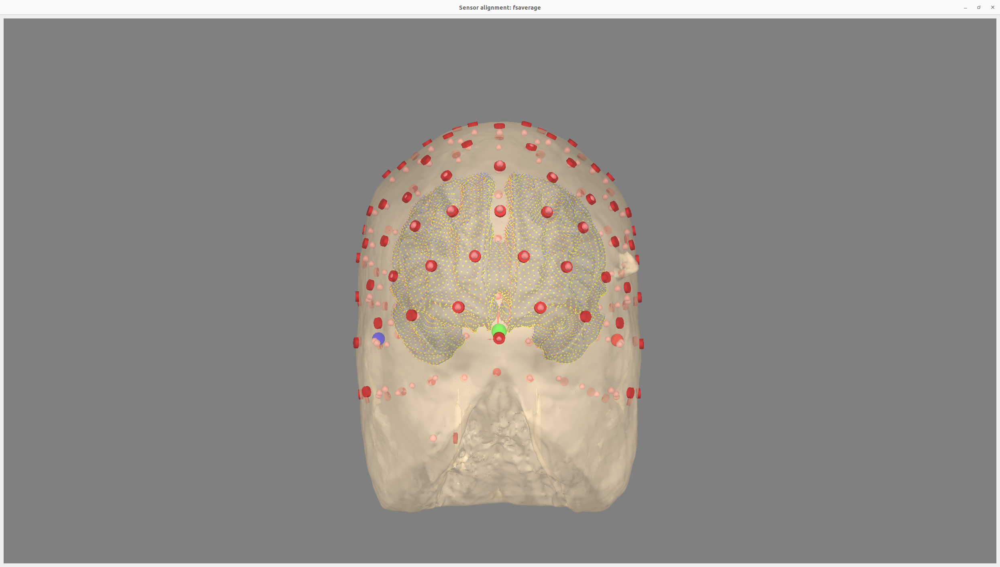

## Create labels from aparc2009 atlas

In [ ]:
# Load labels for the 'aparc' parcellation
Atlas_HCP = 'HCPMMP1' 
Atlas_destrieux = 'aparc.a2009s'
labels = read_labels_from_annot(subject=subject,hemi="both", parc=Atlas_destrieux, subjects_dir=subjects_dir)

# Label of interest:
# S_oc_sup -> Superior Occipital gyrus
# G_oc-temp_lat-fusifor -> Fusiform Face Area
# S_calcarine -> Early Visual Area
# G_oc-temp_lat -> Lateral Occipital gyrus

# Considered a plausible candidate
# S_interm_prim-Jensen -> inferior parietal gyrus

Name_of_label_to_extract = [
                    "G_Ins_lg_and_S_cent_ins-lh",
                    "G_Ins_lg_and_S_cent_ins-rh",
                    "G_and_S_cingul-Ant-lh",
                    "G_and_S_cingul-Ant-rh",
                    "G_and_S_cingul-Mid-Ant-lh",
                    "G_and_S_cingul-Mid-Ant-rh",
                    "G_and_S_cingul-Mid-Post-lh",
                    "G_and_S_cingul-Mid-Post-rh",
                    "G_and_S_frontomargin-lh",
                    "G_and_S_frontomargin-rh",
                    "G_and_S_occipital_inf-lh",
                    "G_and_S_occipital_inf-rh",
                    "G_and_S_paracentral-lh",
                    "G_and_S_paracentral-rh",
                    "G_and_S_subcentral-lh",
                    "G_and_S_subcentral-rh",
                    "G_and_S_transv_frontopol-lh",
                    "G_and_S_transv_frontopol-rh",
                    "G_cingul-Post-dorsal-lh",
                    "G_cingul-Post-dorsal-rh",
                    "G_cingul-Post-ventral-lh",
                    "G_cingul-Post-ventral-rh",
                    "G_cuneus-lh",
                    "G_cuneus-rh",
                    "G_front_inf-Opercular-lh",
                    "G_front_inf-Opercular-rh",
                    "G_front_inf-Orbital-lh",
                    "G_front_inf-Orbital-rh",
                    "G_front_inf-Triangul-lh",
                    "G_front_inf-Triangul-rh",
                    "G_front_middle-lh",
                    "G_front_middle-rh",
                    "G_front_sup-lh",
                    "G_front_sup-rh",
                    "G_insular_short-lh",
                    "G_insular_short-rh",
                    "G_oc-temp_lat-fusifor-lh",
                    "G_oc-temp_lat-fusifor-rh",
                    "G_oc-temp_med-Lingual-lh",
                    "G_oc-temp_med-Lingual-rh",
                    "G_oc-temp_med-Parahip-lh",
                    "G_oc-temp_med-Parahip-rh",
                    "G_occipital_middle-lh",
                    "G_occipital_middle-rh",
                    "G_occipital_sup-lh",
                    "G_occipital_sup-rh",
                    "G_orbital-lh",
                    "G_orbital-rh",
                    "G_pariet_inf-Angular-lh",
                    "G_pariet_inf-Angular-rh",
                    "G_pariet_inf-Supramar-lh",
                    "G_pariet_inf-Supramar-rh",
                    "G_parietal_sup-lh",
                    "G_parietal_sup-rh",
                    "G_postcentral-lh",
                    "G_postcentral-rh",
                    "G_precentral-lh",
                    "G_precentral-rh",
                    "G_precuneus-lh",
                    "G_precuneus-rh",
                    "G_rectus-lh",
                    "G_rectus-rh",
                    "G_subcallosal-lh",
                    "G_subcallosal-rh",
                    "G_temp_sup-G_T_transv-lh",
                    "G_temp_sup-G_T_transv-rh",
                    "G_temp_sup-Lateral-lh",
                    "G_temp_sup-Lateral-rh",
                    "G_temp_sup-Plan_polar-lh",
                    "G_temp_sup-Plan_polar-rh",
                    "G_temp_sup-Plan_tempo-lh",
                    "G_temp_sup-Plan_tempo-rh",
                    "G_temporal_inf-lh",
                    "G_temporal_inf-rh",
                    "G_temporal_middle-lh",
                    "G_temporal_middle-rh",
                    "Lat_Fis-ant-Horizont-lh",
                    "Lat_Fis-ant-Horizont-rh",
                    "Lat_Fis-ant-Vertical-lh",
                    "Lat_Fis-ant-Vertical-rh",
                    "Lat_Fis-post-lh",
                    "Lat_Fis-post-rh",
                    "Pole_occipital-lh",
                    "Pole_occipital-rh",
                    "Pole_temporal-lh",
                    "Pole_temporal-rh",
                    "S_calcarine-lh",
                    "S_calcarine-rh",
                    "S_central-lh",
                    "S_central-rh",
                    "S_cingul-Marginalis-lh",
                    "S_cingul-Marginalis-rh",
                    "S_circular_insula_ant-lh",
                    "S_circular_insula_ant-rh",
                    "S_circular_insula_inf-lh",
                    "S_circular_insula_inf-rh",
                    "S_circular_insula_sup-lh",
                    "S_circular_insula_sup-rh",
                    "S_collat_transv_ant-lh",
                    "S_collat_transv_ant-rh",
                    "S_collat_transv_post-lh",
                    "S_collat_transv_post-rh",
                    "S_front_inf-lh",
                    "S_front_inf-rh",
                    "S_front_middle-lh",
                    "S_front_middle-rh",
                    "S_front_sup-lh",
                    "S_front_sup-rh",
                    "S_interm_prim-Jensen-lh",
                    "S_interm_prim-Jensen-rh",
                    "S_intrapariet_and_P_trans-lh",
                    "S_intrapariet_and_P_trans-rh",
                    "S_oc-temp_lat-lh",
                    "S_oc-temp_lat-rh",
                    "S_oc-temp_med_and_Lingual-lh",
                    "S_oc-temp_med_and_Lingual-rh",
                    "S_oc_middle_and_Lunatus-lh",
                    "S_oc_middle_and_Lunatus-rh",
                    "S_oc_sup_and_transversal-lh",
                    "S_oc_sup_and_transversal-rh",
                    "S_occipital_ant-lh",
                    "S_occipital_ant-rh",
                    "S_orbital-H_Shaped-lh",
                    "S_orbital-H_Shaped-rh",
                    "S_orbital_lateral-lh",
                    "S_orbital_lateral-rh",
                    "S_orbital_med-olfact-lh",
                    "S_orbital_med-olfact-rh",
                    "S_parieto_occipital-lh",
                    "S_parieto_occipital-rh",
                    "S_pericallosal-lh",
                    "S_pericallosal-rh",
                    "S_postcentral-lh",
                    "S_postcentral-rh",
                    "S_precentral-inf-part-lh",
                    "S_precentral-inf-part-rh",
                    "S_precentral-sup-part-lh",
                    "S_precentral-sup-part-rh",
                    "S_suborbital-lh",
                    "S_suborbital-rh",
                    "S_subparietal-lh",
                    "S_subparietal-rh",
                    "S_temporal_inf-lh",
                    "S_temporal_inf-rh",
                    "S_temporal_sup-lh",
                    "S_temporal_sup-rh",
                    "S_temporal_transverse-lh",
                    "S_temporal_transverse-rh",
                    "Unknown-lh",
                    "Unknown-rh"
]

Name_of_label_to_extract_HCP = ["FFC", 
                    "L_V1",
                    "R_V1",
                    "LO1", 
                    "LO2", 
                    "LO3", 
                    "IPS1",
                    "7PC",
                    "V6A",
                    "V7"
                    ]

Labels_to_extract = []
for labels_prefix in Name_of_label_to_extract:
    for label in labels:
        if f'{labels_prefix}' in label.name:
            Labels_to_extract.append(label)

print("List of Labels to extract from SourceEstimate \n",Labels_to_extract)

## Source extraction 

### Same for STOP-IN and PUNCH-TROUGH just think to change 'si' in 'pt' 

#### All condition

In [ ]:
ep_si.set_eeg_reference()
# Calcul de la matrice de covariance du bruit
noise_cov_si = mne.compute_covariance(ep_si, tmax=0., method='auto', rank=None)

# Calcul de la solution inverse
inverse_operator_si = mne.minimum_norm.make_inverse_operator(ep_si.info, fwd, noise_cov_si, loose=0.2, depth=0.8)

# Application de l'inversion
ep_si.set_eeg_reference(projection=True)

stc_ep_si = mne.minimum_norm.apply_inverse(ep_si.average(), inverse_operator_si,lambda2=1/9., method='dSPM', pick_ori="normal")

# Visualisation des résultats
#brain = stc.plot(subjects_dir=subjects_dir, subject=subject, surface='inflated', hemi='both', title='Alpha Band')

ep_si_series = {}

for regions in Labels_to_extract:
    ep_si_series[regions.name] = mne.extract_label_time_course(stcs=stc_ep_si.copy().crop(-0.8, 0.0), labels=regions, mode="pca_flip", src=src, return_generator=True) # Mode by default is mean
   
print("List of all the time series label extracted", ep_si_series.keys())

# Hann filter to apply on the data, to smooth them
hann_filter_si = np.hanning(stc_ep_si.copy().crop(-0.8, 0.0).times.shape[0])


fig, ax = plt.subplots(1, len(ep_si_series.keys()), dpi=300, figsize = (55, 5))

for i, regions_label in enumerate(ep_si_series.keys()):
    ax[i].plot(stc_ep_si.copy().crop(-0.8, 0.0).times, ep_si_series[f"{regions_label}"][0])
    ax[i].vlines(-0.4, ep_si_series[f"{regions_label}"][0].min(), ep_si_series[f"{regions_label}"][0].max(), "k", "--")
    ax[i].set_xlabel("Time (ms)")
    ax[i].set_ylabel("Potential")
    ax[i].set_title(f"{regions_label}")
fig.suptitle("Time series of the extracted sources for the  SI")
plt.show()

fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
for i, regions_label in enumerate(list(ep_si_series.keys())[0::2]):
    ax.plot(stc_ep_si.copy().crop(-0.8, 0.0).times, ep_si_series[f"{regions_label}"][0], label=f"{regions_label}")
ax.set_xlabel("Time (ms)")
ax.set_ylabel("Potential")
ax.set_title("SI")
#ax.legend(loc='upper right')

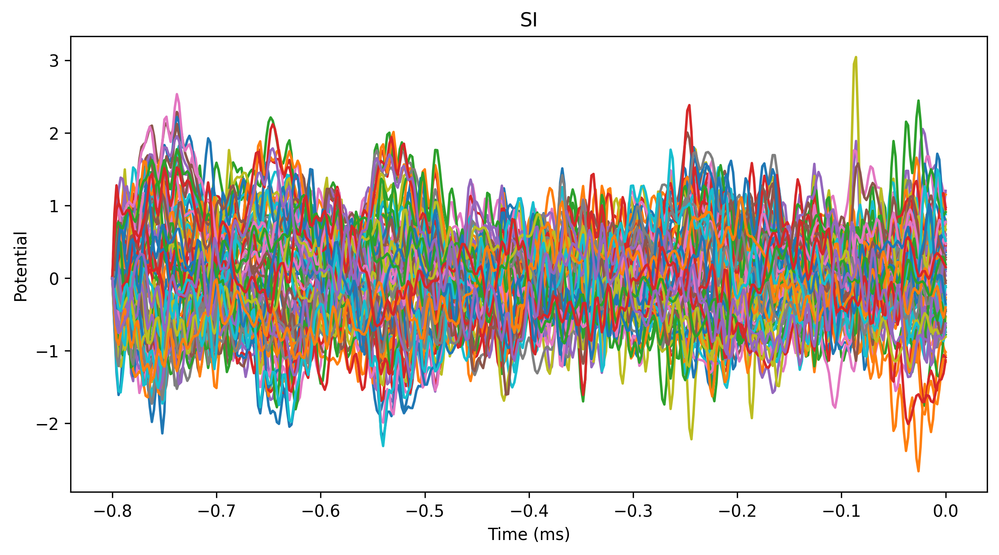 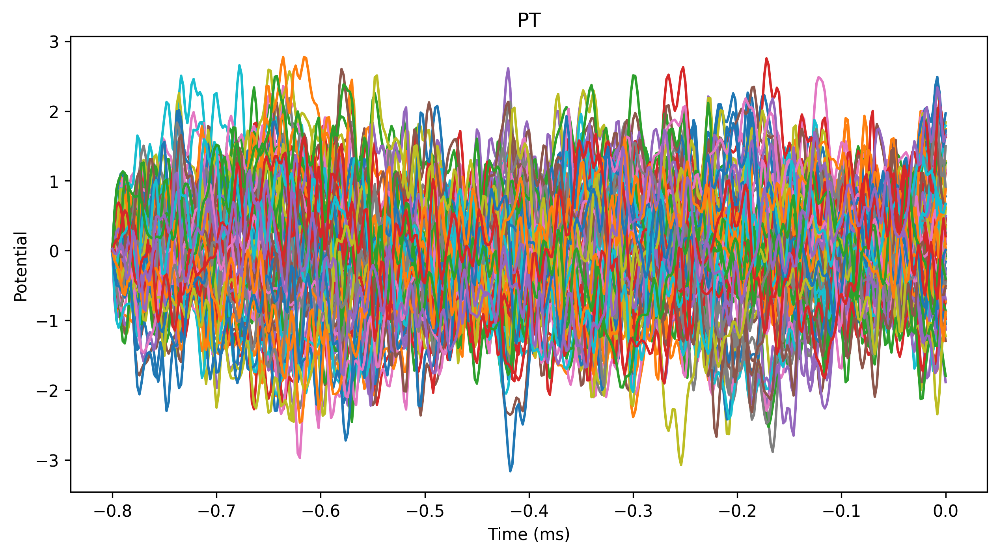

#### Solo condition

In [ ]:
ep_solo_si.set_eeg_reference()
# Calcul de la matrice de covariance du bruit
noise_cov_solo_si = mne.compute_covariance(ep_solo_si, tmax=0., method='auto', rank=None)

# Calcul de la solution inverse
inverse_operator_solo_si = mne.minimum_norm.make_inverse_operator(ep_solo_si.info, fwd, noise_cov_solo_si, loose=0.2, depth=0.8)

# Application de l'inversion
ep_solo_si.set_eeg_reference(projection=True)

stc_ep_solo_si = mne.minimum_norm.apply_inverse(ep_solo_si.average(), inverse_operator_solo_si,lambda2=1/9., method='dSPM', pick_ori="normal")

# Visualisation des résultats
#brain = stc.plot(subjects_dir=subjects_dir, subject=subject, surface='inflated', hemi='both', title='Alpha Band')

ep_solo_si_series = {}

for regions in Labels_to_extract:
    ep_solo_si_series[regions.name] = mne.extract_label_time_course(stcs=stc_ep_solo_si.copy().crop(-0.8, 0.0), labels=regions, mode="pca_flip", src=src, return_generator=True) # Mode by default is mean
   
print("List of all the time series label extracted", ep_solo_si_series.keys())

# Hann filter to apply on the data, to smooth them
hann_filter_solo_si = np.hanning(stc_ep_solo_si.copy().crop(-0.8, 0.0).times.shape[0])


fig, ax = plt.subplots(1, len(ep_solo_si_series.keys()), dpi=300, figsize = (55, 5))

for i, regions_label in enumerate(ep_solo_si_series.keys()):
    ax[i].plot(stc_ep_solo_si.copy().crop(-0.8, 0.0).times, ep_solo_si_series[f"{regions_label}"][0])
    ax[i].vlines(-0.4, ep_solo_si_series[f"{regions_label}"][0].min(), ep_solo_si_series[f"{regions_label}"][0].max(), "k", "--")
    ax[i].set_xlabel("Time (ms)")
    ax[i].set_ylabel("Potential")
    ax[i].set_title(f"{regions_label}")
fig.suptitle("Time series of the extracted sources for the  solo_SI")
plt.show()

fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
for i, regions_label in enumerate(list(ep_solo_si_series.keys())[0::2]):
    ax.plot(stc_ep_solo_si.copy().crop(-0.8, 0.0).times, ep_solo_si_series[f"{regions_label}"][0] , label=f"{regions_label}")
ax.set_xlabel("Time (ms)")
ax.set_ylabel("Potential")
ax.set_title("solo_SI")
#ax.legend(loc='upper right')

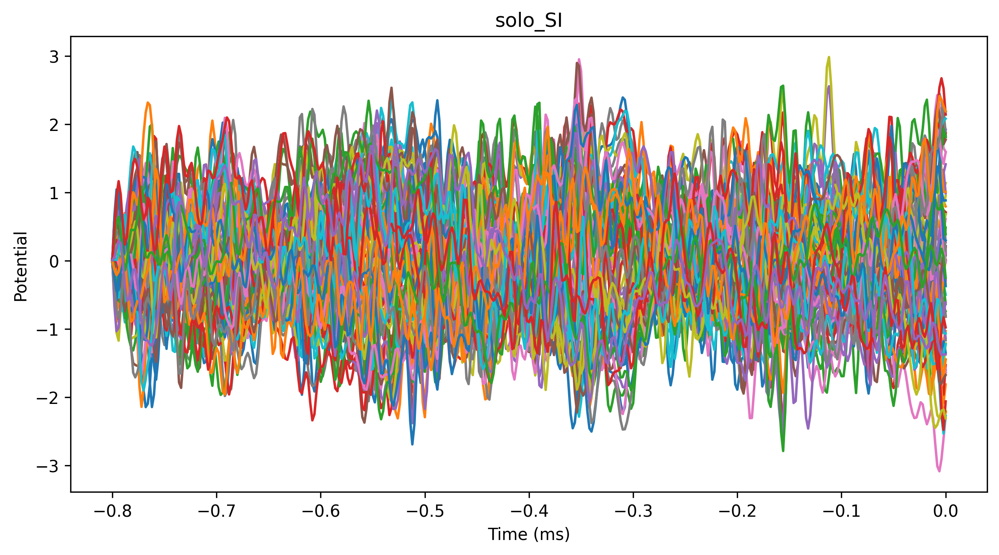  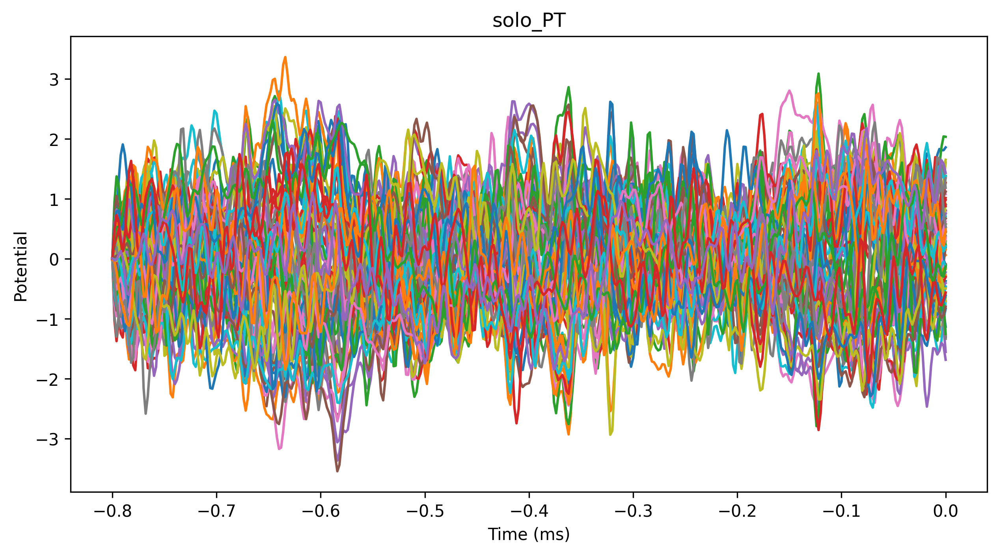 

#### Easy condition

In [ ]:
ep_easy_si.set_eeg_reference()
# Calcul de la matrice de covariance du bruit
noise_cov_easy_si = mne.compute_covariance(ep_easy_si, tmax=0., method='auto', rank=None)

# Calcul de la solution inverse
inverse_operator_easy_si = mne.minimum_norm.make_inverse_operator(ep_easy_si.info, fwd, noise_cov_easy_si, loose=0.2, depth=0.8)

# Application de l'inversion
ep_easy_si.set_eeg_reference(projection=True)

stc_ep_easy_si = mne.minimum_norm.apply_inverse(ep_easy_si.average(), inverse_operator_easy_si,lambda2=1/9., method='dSPM', pick_ori="normal")

# Visualisation des résultats
#brain = stc.plot(subjects_dir=subjects_dir, subject=subject, surface='inflated', hemi='both', title='Alpha Band')

ep_easy_si_series = {}

for regions in Labels_to_extract:
    ep_easy_si_series[regions.name] = mne.extract_label_time_course(stcs=stc_ep_easy_si.copy().crop(-0.8, 0.0), labels=regions, mode="pca_flip", src=src, return_generator=True) # Mode by default is mean
   
print("List of all the time series label extracted", ep_easy_si_series.keys())

# Hann filter to apply on the data, to smooth them
hann_filter_easy_si = np.hanning(stc_ep_easy_si.copy().crop(-0.8, 0.0).times.shape[0])


fig, ax = plt.subplots(1, len(ep_easy_si_series.keys()), dpi=300, figsize = (55, 5))

for i, regions_label in enumerate(ep_easy_si_series.keys()):
    ax[i].plot(stc_ep_easy_si.copy().crop(-0.8, 0.0).times, ep_easy_si_series[f"{regions_label}"][0])
    ax[i].vlines(-0.4, ep_easy_si_series[f"{regions_label}"][0].min(), ep_easy_si_series[f"{regions_label}"][0].max(), "k", "--")
    ax[i].set_xlabel("Time (ms)")
    ax[i].set_ylabel("Potential")
    ax[i].set_title(f"{regions_label}")
fig.suptitle("Time series of the extracted sources for the  easy_SI")
plt.show()

fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
for i, regions_label in enumerate(list(ep_easy_si_series.keys())[0::2]):
    ax.plot(stc_ep_easy_si.copy().crop(-0.8, 0.0).times, ep_easy_si_series[f"{regions_label}"][0], label=f"{regions_label}")
ax.set_xlabel("Time (ms)")
ax.set_ylabel("Potential")
ax.set_title("easy_SI")
#ax.legend(loc='upper right')

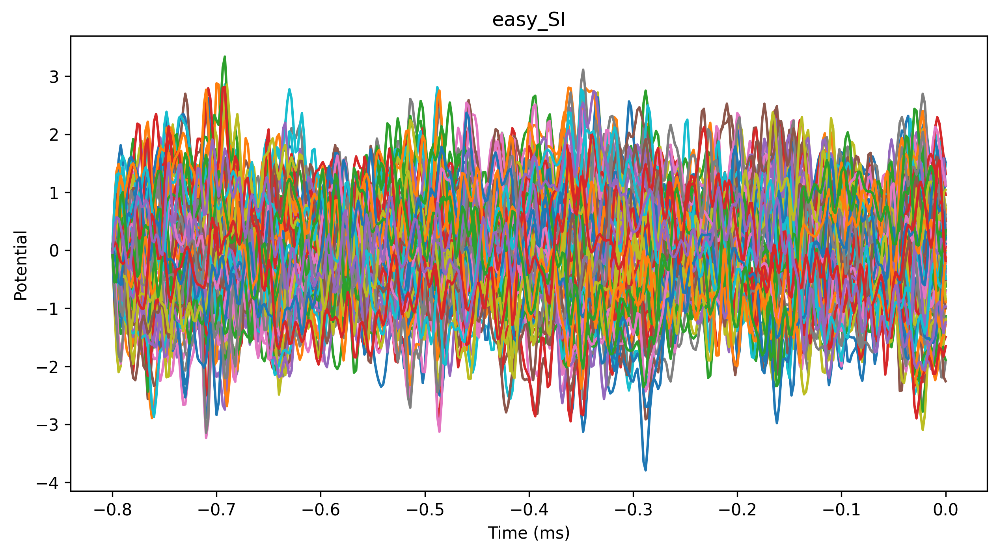 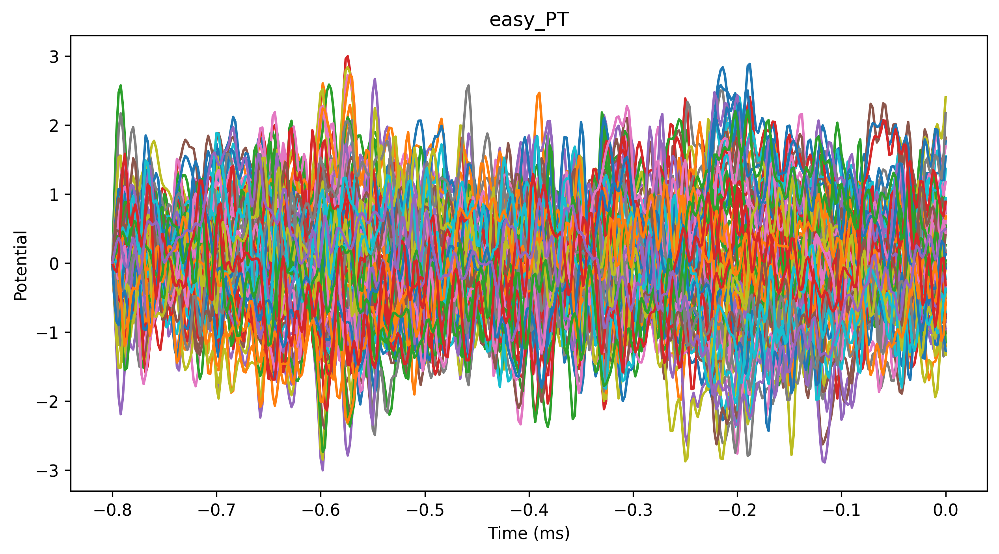 

#### Hard condition

In [ ]:
ep_hard_si.set_eeg_reference()
# Calcul de la matrice de covariance du bruit
noise_cov_hard_si = mne.compute_covariance(ep_hard_si, tmax=0., method='auto', rank=None)

# Calcul de la solution inverse
inverse_operator_hard_si = mne.minimum_norm.make_inverse_operator(ep_hard_si.info, fwd, noise_cov_hard_si, loose=0.2, depth=0.8)

# Application de l'inversion
ep_hard_si.set_eeg_reference(projection=True)

stc_ep_hard_si = mne.minimum_norm.apply_inverse(ep_hard_si.average(), inverse_operator_hard_si,lambda2=1/9., method='dSPM', pick_ori="normal")

# Visualisation des résultats
#brain = stc.plot(subjects_dir=subjects_dir, subject=subject, surface='inflated', hemi='both', title='Alpha Band')

ep_hard_si_series = {}

for regions in Labels_to_extract:
    ep_hard_si_series[regions.name] = mne.extract_label_time_course(stcs=stc_ep_hard_si.copy().crop(-0.8, 0.0), labels=regions, mode="pca_flip", src=src, return_generator=True) # Mode by default is mean
   
print("List of all the time series label extracted", ep_hard_si_series.keys())

# Hann filter to apply on the data, to smooth them
hann_filter_hard_si = np.hanning(stc_ep_hard_si.copy().crop(-0.8, 0.0).times.shape[0])


fig, ax = plt.subplots(1, len(ep_hard_si_series.keys()), dpi=300, figsize = (55, 5))

for i, regions_label in enumerate(ep_hard_si_series.keys()):
    ax[i].plot(stc_ep_hard_si.copy().crop(-0.8, 0.0).times, ep_hard_si_series[f"{regions_label}"][0])
    ax[i].vlines(-0.4, ep_hard_si_series[f"{regions_label}"][0].min(), ep_hard_si_series[f"{regions_label}"][0].max(), "k", "--")
    ax[i].set_xlabel("Time (ms)")
    ax[i].set_ylabel("Potential")
    ax[i].set_title(f"{regions_label}")
fig.suptitle("Time series of the extracted sources for the  hard_SI")
plt.show()

fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
for i, regions_label in enumerate(list(ep_hard_si_series.keys())[0::2]):
    ax.plot(stc_ep_hard_si.copy().crop(-0.8, 0.0).times, ep_hard_si_series[f"{regions_label}"][0] , label=f"{regions_label}")
ax.set_xlabel("Time (ms)")
ax.set_ylabel("Potential")
ax.set_title("hard_SI")
#ax.legend(loc='upper right')

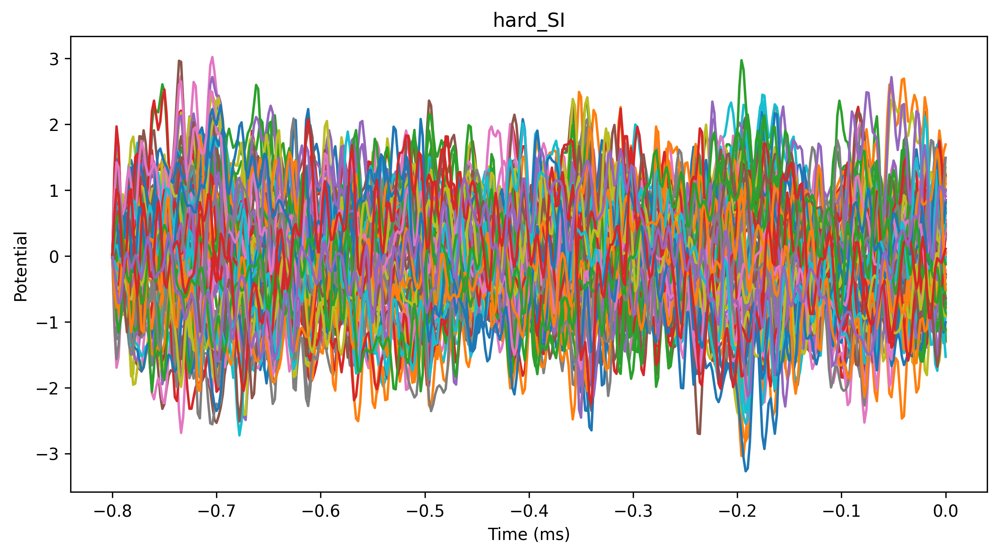 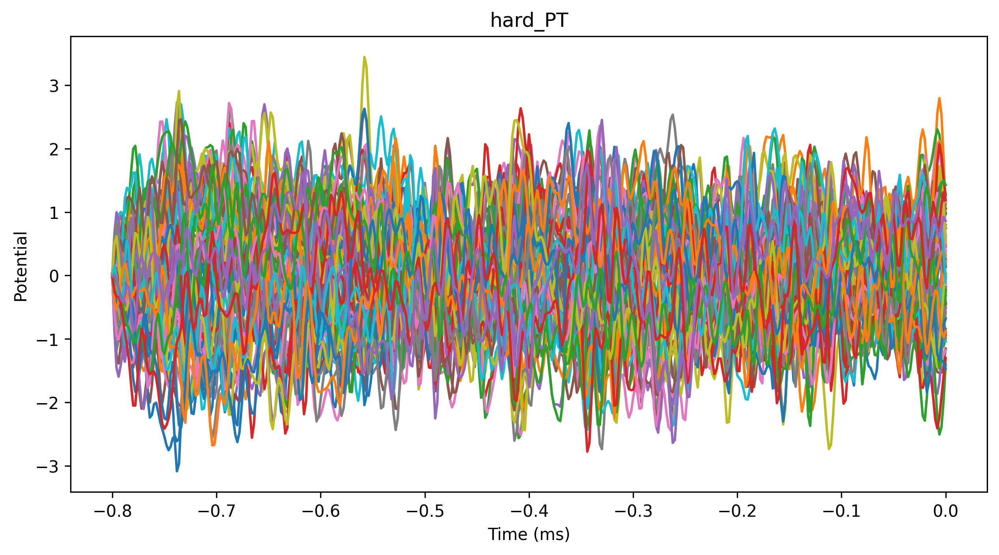